# Sharvari Lahane
# Data Science - Batch May 2024 (Baner, Pune) - Assignment 17
# SVM

###**Task 1: Exploratory Data Analysis (EDA)**

Importing necessary libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Loading the dataset

In [3]:
df = pd.read_csv('mushroom.csv')

In [4]:
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,863,sunken,scaly,brown,yes,foul,attached,crowded,narrow,chocolate,...,partial,orange,one,flaring,purple,abundant,leaves,poisonous,5.877891,17.464145
1996,1160,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,...,partial,white,one,zone,yellow,numerous,waste,poisonous,6.500840,13.501957
1997,265,convex,grooves,green,yes,fishy,notched,close,narrow,pink,...,partial,brown,two,evanescent,yellow,abundant,woods,poisonous,13.558064,11.270020
1998,411,bell,smooth,white,no,pungent,free,close,narrow,orange,...,universal,yellow,one,cobwebby,brown,solitary,woods,poisonous,11.092703,8.423199


In [6]:
print("Data Shape:", df.shape)

Data Shape: (2000, 26)


In [7]:
print("Data Columns:", df.columns)

Data Columns: Index(['Unnamed: 0', 'cap_shape', 'cap_surface', 'cap_color', 'bruises',
       'odor', 'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat', 'class',
       'stalk_height', 'cap_diameter'],
      dtype='object')


In [8]:
print("Data Types:\n", df.dtypes)

Data Types:
 Unnamed: 0                    int64
cap_shape                    object
cap_surface                  object
cap_color                    object
bruises                      object
odor                         object
gill_attachment              object
gill_spacing                 object
gill_size                    object
gill_color                   object
stalk_shape                  object
stalk_root                   object
stalk_surface_above_ring     object
stalk_surface_below_ring     object
stalk_color_above_ring       object
stalk_color_below_ring       object
veil_type                    object
veil_color                   object
ring_number                  object
ring_type                    object
spore_print_color            object
population                   object
habitat                      object
class                        object
stalk_height                float64
cap_diameter                float64
dtype: object


In [9]:
print("Missing Values:\n", df.isnull().sum())

Missing Values:
 Unnamed: 0                  0
cap_shape                   0
cap_surface                 0
cap_color                   0
bruises                     0
odor                        0
gill_attachment             0
gill_spacing                0
gill_size                   0
gill_color                  0
stalk_shape                 0
stalk_root                  0
stalk_surface_above_ring    0
stalk_surface_below_ring    0
stalk_color_above_ring      0
stalk_color_below_ring      0
veil_type                   0
veil_color                  0
ring_number                 0
ring_type                   0
spore_print_color           0
population                  0
habitat                     0
class                       0
stalk_height                0
cap_diameter                0
dtype: int64


Utilizing histograms, box plots, or density plots to understand feature distributions

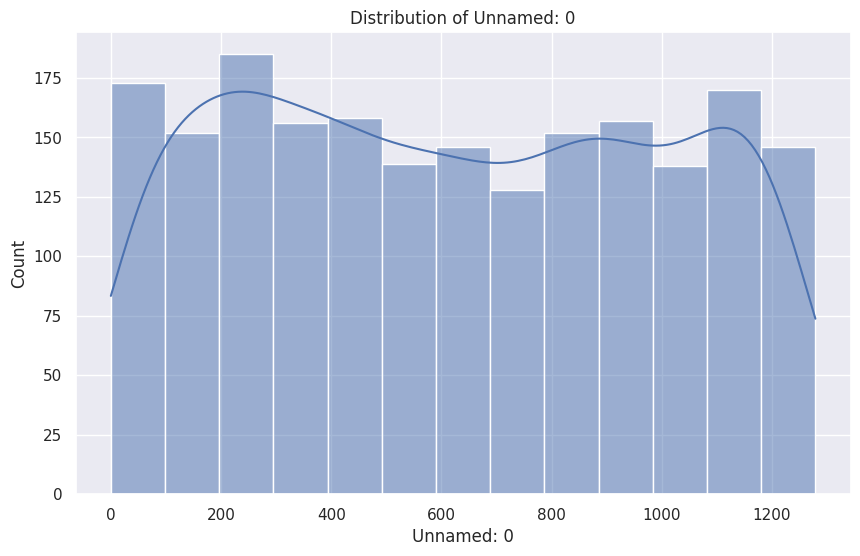

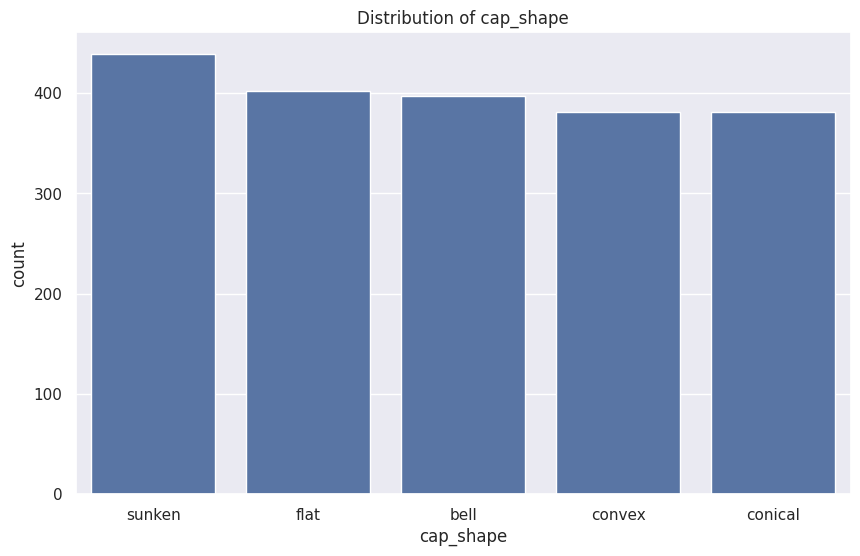

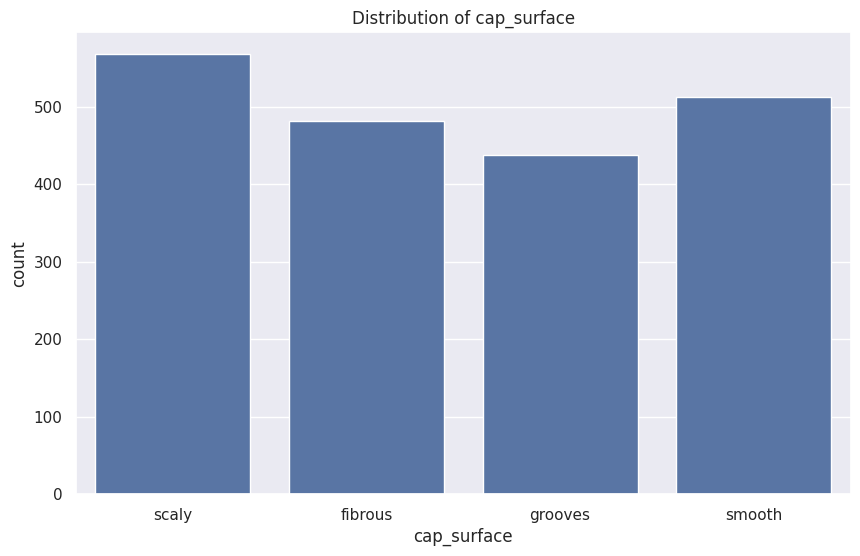

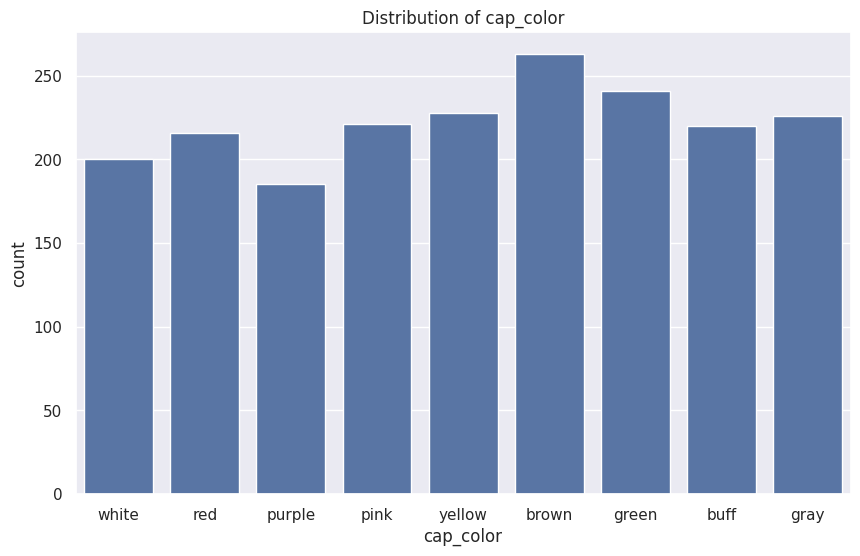

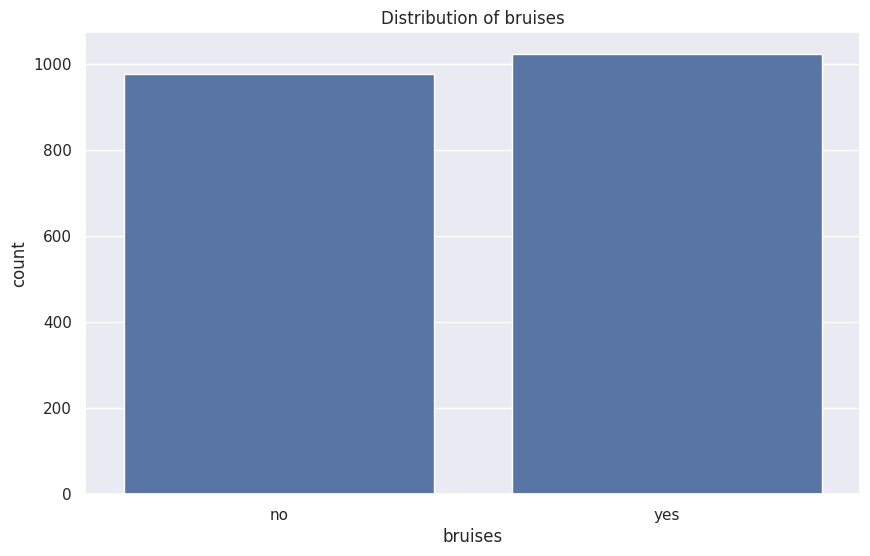

...

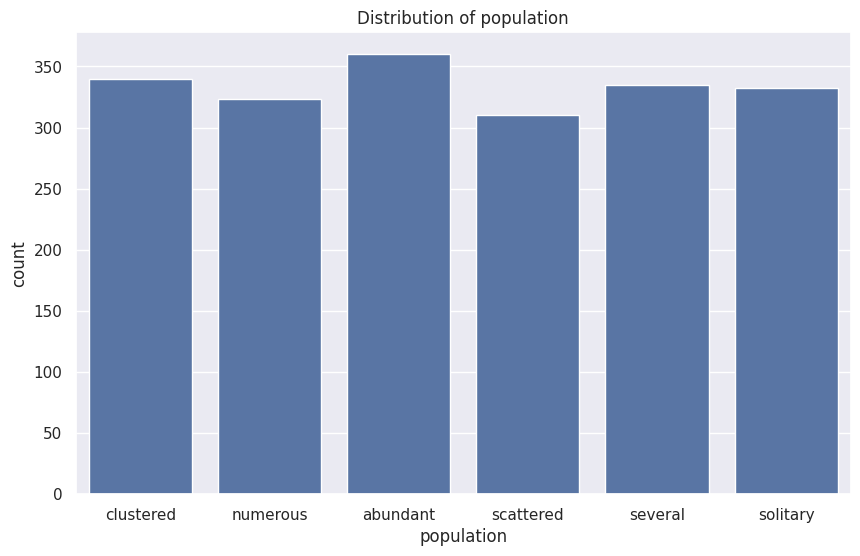

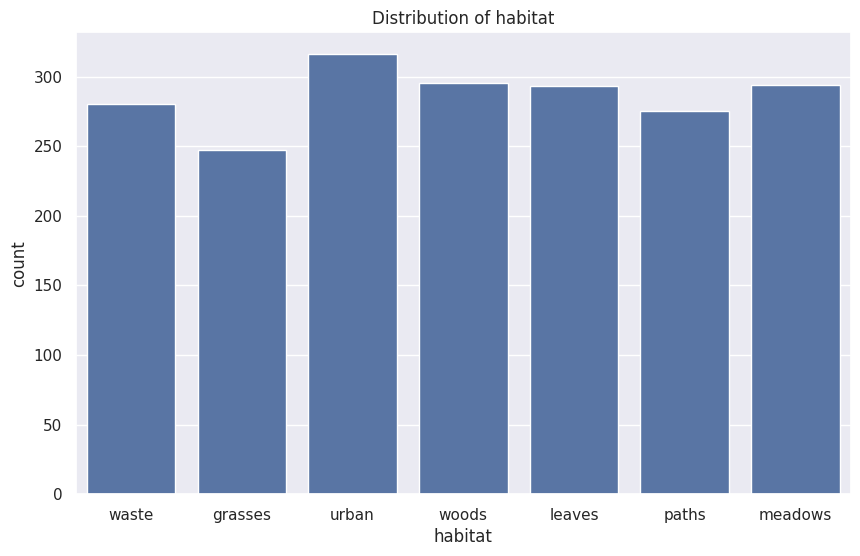

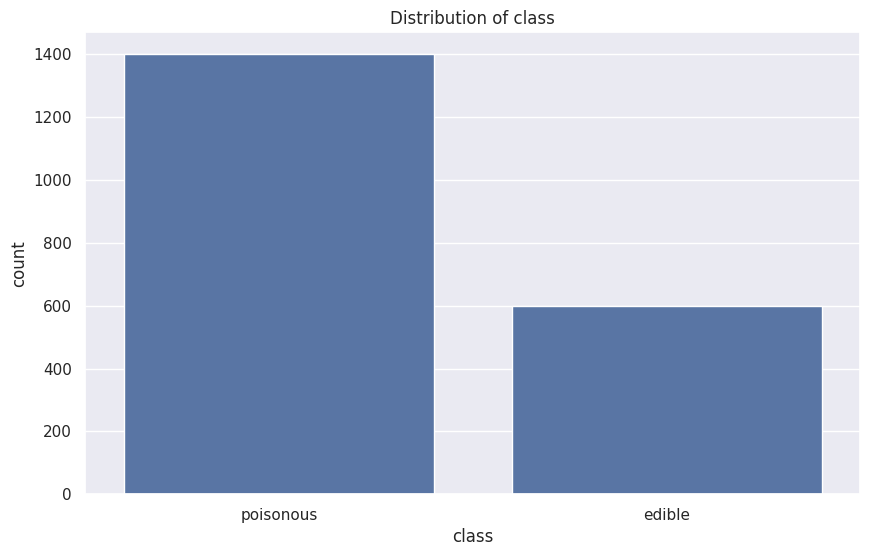

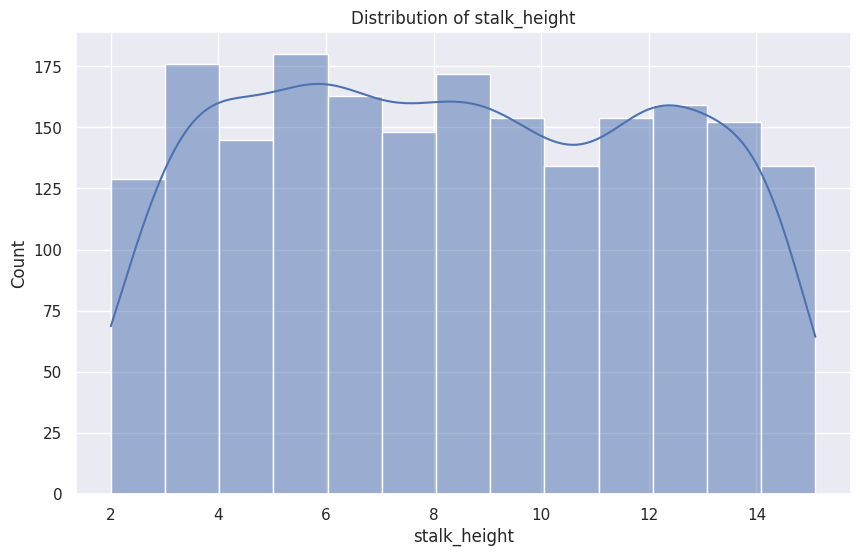

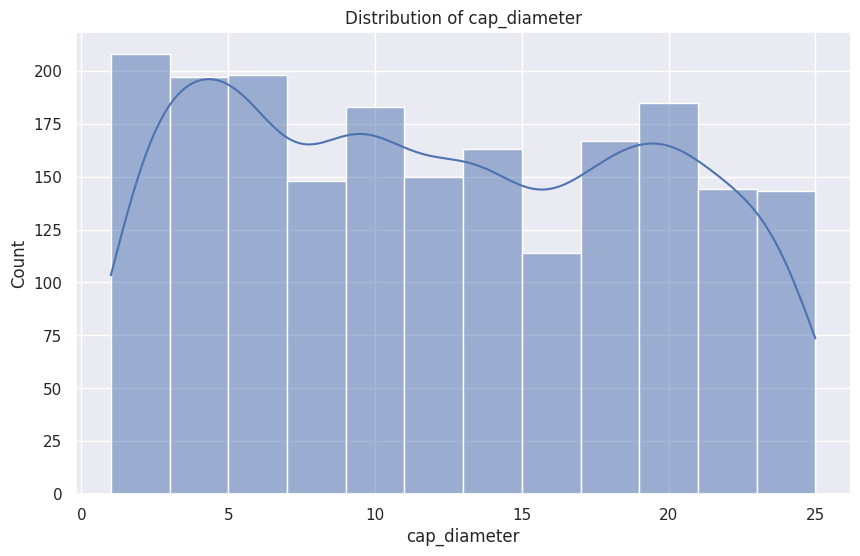

In [11]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

sns.set()
for col in df.columns:
    if df[col].dtype == 'object':
        plt.figure(figsize=(10,6))
        sns.countplot(x=col, data=df)
        plt.title(f'Distribution of {col}')
        plt.show()
    else:
        plt.figure(figsize=(10,6))
        sns.histplot(df[col], kde=True)
        plt.title(f'Distribution of {col}')
        plt.show()

Investigating feature correlations to discern relationships within the data

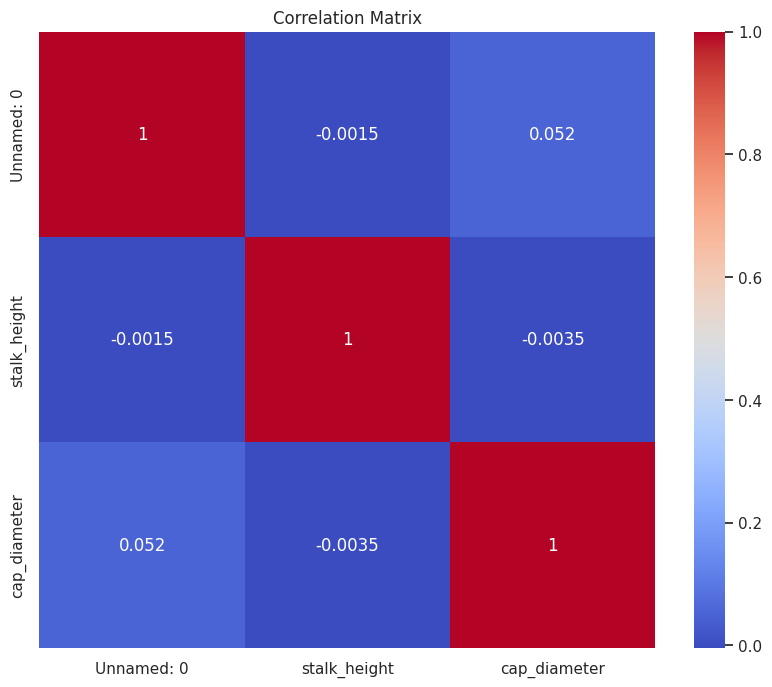

In [13]:
numeric_df = df.select_dtypes(include=['int64', 'float64'])
corr_matrix = numeric_df.corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)
plt.title('Correlation Matrix')
plt.show()

###**Task 2: Data Preprocessing**

Importing necessary libraries

In [14]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

Encoding categorical variables if necessary

In [16]:
le = LabelEncoder()
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    df[col] = le.fit_transform(df[col])

In [17]:
le

LabelEncoder()

In [18]:
categorical_cols

Index(['cap_shape', 'cap_surface', 'cap_color', 'bruises', 'odor',
       'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat', 'class'],
      dtype='object')

Splitting the dataset into training and testing sets

In [19]:
X = df.drop('class', axis=1)
Y = df['class']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [20]:
X

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
0,1167,4,2,7,0,1,1,2,0,7,...,8,0,0,2,6,3,1,5,14.276173,5.054983
1,1037,4,0,6,0,1,3,1,1,3,...,0,1,0,2,6,1,2,5,3.952715,19.068319
2,309,3,1,5,1,4,1,1,0,8,...,3,1,3,2,6,6,0,5,9.054265,7.205884
3,282,0,2,4,1,3,3,0,0,6,...,5,0,3,2,0,4,1,0,5.226499,20.932692
4,820,3,3,8,1,5,2,1,1,6,...,7,1,2,0,4,8,1,4,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,863,4,2,0,1,4,0,1,1,3,...,4,0,1,1,2,6,0,1,5.877891,17.464145
1996,1160,4,2,5,1,5,0,2,1,9,...,4,0,2,1,7,8,2,5,6.500840,13.501957
1997,265,2,1,3,1,3,3,0,1,7,...,6,0,0,2,1,8,0,6,13.558064,11.270020
1998,411,0,3,7,0,7,2,0,1,6,...,5,1,3,1,0,1,5,6,11.092703,8.423199


In [21]:
Y

,class
0,1
1,0
2,1
3,1
4,1
...,...
1995,1
1996,1
1997,1
1998,1


In [22]:
X_train

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
968,1172,4,0,4,0,7,2,2,1,6,...,8,0,1,1,3,4,3,2,10.471065,16.238880
240,413,3,0,6,1,6,2,0,1,10,...,4,0,1,1,1,1,2,6,6.100838,15.120614
819,1226,1,1,0,0,3,1,2,0,11,...,8,0,0,1,2,4,0,5,6.702634,4.882309
692,327,4,2,2,1,4,2,2,1,2,...,5,0,2,1,2,7,0,2,8.248369,17.363862
420,671,4,3,7,1,5,0,1,1,7,...,2,1,1,0,0,2,1,0,14.514271,9.284473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,609,4,2,8,0,1,3,0,0,8,...,4,0,0,0,6,2,3,6,10.973666,13.435538
1294,1244,1,1,6,1,4,3,2,1,8,...,8,0,0,0,5,2,3,0,2.570015,8.892683
860,2,3,3,0,0,4,0,2,0,6,...,4,0,3,2,0,3,4,5,3.628180,9.636546
1459,1105,4,1,8,0,1,1,1,0,4,...,7,0,2,0,5,6,4,5,6.156392,22.060143


In [23]:
Y_train

,class
968,0
240,1
819,1
692,1
420,1
...,...
1130,0
1294,1
860,1
1459,1


In [24]:
X_test

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
1860,70,4,3,6,0,1,1,1,0,6,...,1,0,2,1,6,7,1,0,5.082701,9.832412
353,1051,3,3,0,1,1,1,0,1,6,...,0,1,3,0,5,6,4,3,13.567945,3.847521
1333,1027,3,1,4,1,2,2,0,0,11,...,6,0,0,1,5,0,3,6,13.675796,8.893702
905,65,3,0,1,1,7,0,2,1,1,...,4,0,2,0,5,7,5,3,6.457211,7.467354
1289,77,3,2,6,1,5,2,2,0,3,...,8,1,2,2,3,0,2,3,10.328610,13.623257
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
965,1052,1,3,3,1,6,2,1,0,6,...,3,0,3,1,7,6,1,1,8.269459,1.175995
1284,543,4,2,6,0,0,0,1,1,3,...,0,0,1,2,4,3,3,6,4.541249,12.399689
1739,232,3,2,0,1,2,2,2,1,6,...,0,0,3,2,7,7,5,4,3.980998,5.041937
261,59,4,2,3,0,8,0,0,0,1,...,2,1,2,2,0,6,1,0,2.932738,21.737761


In [25]:
Y_test

,class
1860,1
353,1
1333,0
905,1
1289,0
...,...
965,1
1284,1
1739,1
261,1


In [26]:
print("Training Set Shape:", X_train.shape, Y_train.shape)
print("Testing Set Shape:", X_test.shape, Y_test.shape)

Training Set Shape: (1600, 25) (1600,)
Testing Set Shape: (400, 25) (400,)


###**Task 3: Data Visualization**

Importing necessary libraries and loading the dataset

In [27]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Employ scatter plots, pair plots, or relevant visualizations to comprehend feature distributions and relationships.

In [28]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="seaborn")

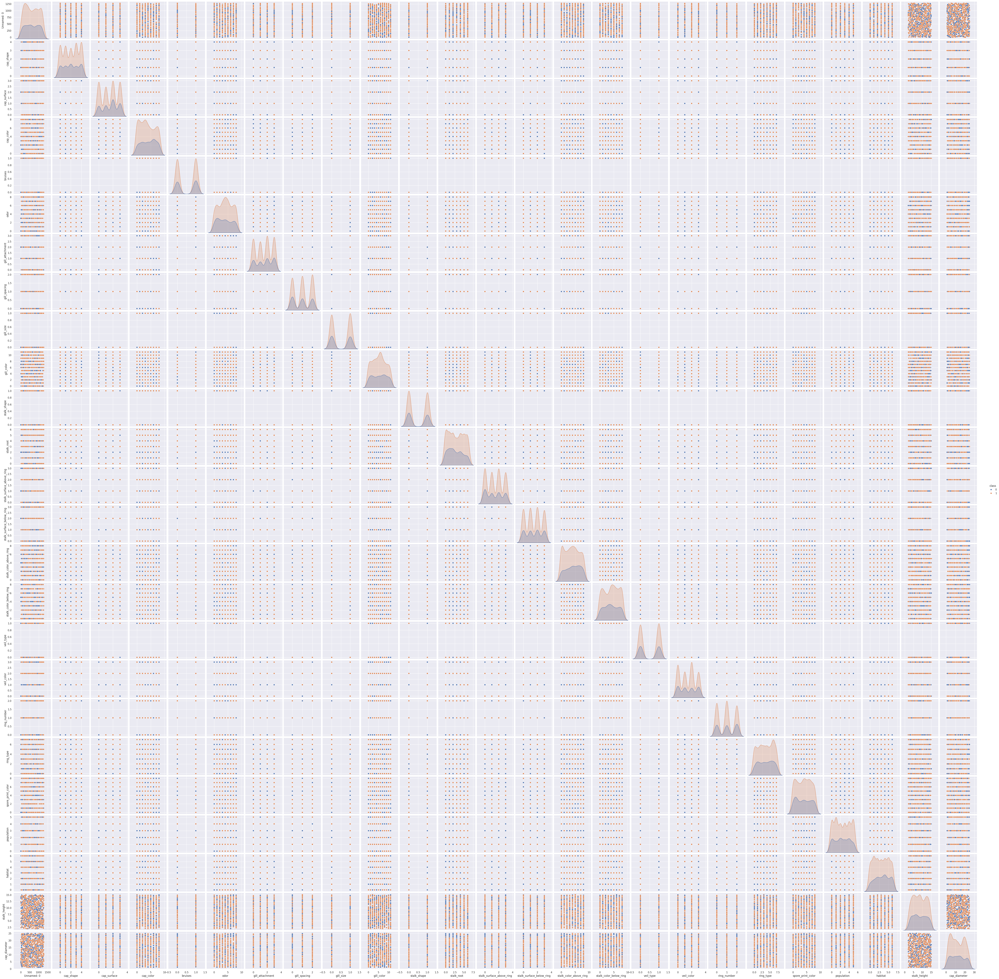

In [30]:
sns.pairplot(df, hue='class')
plt.show()

Visualize class distributions to gauge dataset balance or imbalance.

Creating a count plot to visualize class distributions

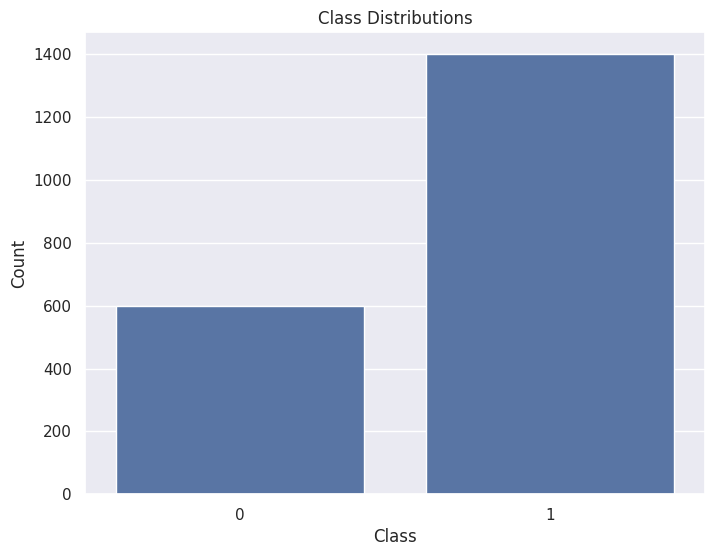

In [32]:
plt.figure(figsize=(8, 6))
sns.countplot(x='class', data=df)
plt.title('Class Distributions')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

Create a scatter plot to visualize the relationship between cap-shape and cap-color.

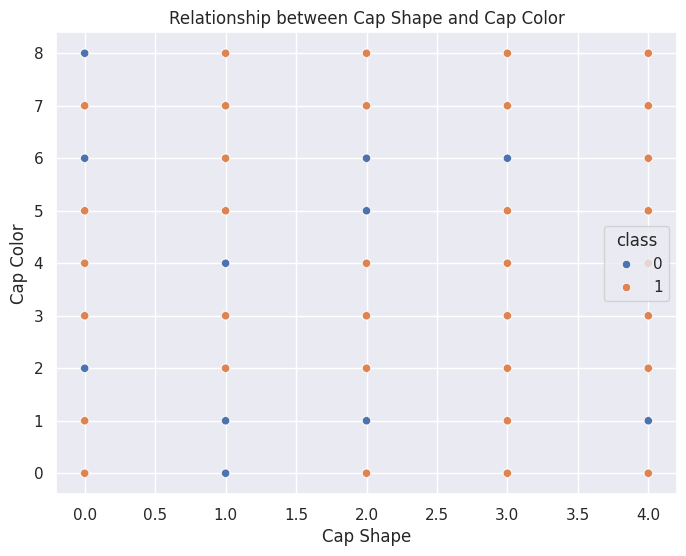

In [34]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='cap_shape', y='cap_color', hue='class', data=df)
plt.title('Relationship between Cap Shape and Cap Color')
plt.xlabel('Cap Shape')
plt.ylabel('Cap Color')
plt.show()

###**Task 4: SVM Implementation**

Importing necessary libraries

In [35]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

Data Preprocessing

One-hot encoding for categorical features

Defining the feature matrix (X) and target vector (Y)

In [36]:
df.columns

Index(['Unnamed: 0', 'cap_shape', 'cap_surface', 'cap_color', 'bruises',
       'odor', 'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat', 'class',
       'stalk_height', 'cap_diameter'],
      dtype='object')

Printing the column names with leading and trailing spaces removed

In [37]:
print([col.strip() for col in df.columns])

['Unnamed: 0', 'cap_shape', 'cap_surface', 'cap_color', 'bruises', 'odor', 'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color', 'stalk_shape', 'stalk_root', 'stalk_surface_above_ring', 'stalk_surface_below_ring', 'stalk_color_above_ring', 'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number', 'ring_type', 'spore_print_color', 'population', 'habitat', 'class', 'stalk_height', 'cap_diameter']


In [39]:
X = pd.get_dummies(df.loc[:, ~df.columns.isin(['stalk_height', 'cap_diameter'])])
Y = df['cap_diameter']

In [40]:
X

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_above_ring,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class
0,1167,4,2,7,0,1,1,2,0,7,...,3,8,0,0,2,6,3,1,5,1
1,1037,4,0,6,0,1,3,1,1,3,...,2,0,1,0,2,6,1,2,5,0
2,309,3,1,5,1,4,1,1,0,8,...,8,3,1,3,2,6,6,0,5,1
3,282,0,2,4,1,3,3,0,0,6,...,8,5,0,3,2,0,4,1,0,1
4,820,3,3,8,1,5,2,1,1,6,...,3,7,1,2,0,4,8,1,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,863,4,2,0,1,4,0,1,1,3,...,5,4,0,1,1,2,6,0,1,1
1996,1160,4,2,5,1,5,0,2,1,9,...,5,4,0,2,1,7,8,2,5,1
1997,265,2,1,3,1,3,3,0,1,7,...,0,6,0,0,2,1,8,0,6,1
1998,411,0,3,7,0,7,2,0,1,6,...,3,5,1,3,1,0,1,5,6,1


In [41]:
Y

,cap_diameter
0,5.054983
1,19.068319
2,7.205884
3,20.932692
4,12.545245
...,...
1995,17.464145
1996,13.501957
1997,11.270020
1998,8.423199


In [42]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
for col in X.columns:
    if X[col].dtype == 'object':
        X[col] = le.fit_transform(X[col])

Splitting the data into training and testing sets

In [44]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
X_train

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_above_ring,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class
968,1172,4,0,4,0,7,2,2,1,6,...,6,8,0,1,1,3,4,3,2,0
240,413,3,0,6,1,6,2,0,1,10,...,0,4,0,1,1,1,1,2,6,1
819,1226,1,1,0,0,3,1,2,0,11,...,4,8,0,0,1,2,4,0,5,1
692,327,4,2,2,1,4,2,2,1,2,...,3,5,0,2,1,2,7,0,2,1
420,671,4,3,7,1,5,0,1,1,7,...,0,2,1,1,0,0,2,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,609,4,2,8,0,1,3,0,0,8,...,0,4,0,0,0,6,2,3,6,0
1294,1244,1,1,6,1,4,3,2,1,8,...,0,8,0,0,0,5,2,3,0,1
860,2,3,3,0,0,4,0,2,0,6,...,0,4,0,3,2,0,3,4,5,1
1459,1105,4,1,8,0,1,1,1,0,4,...,6,7,0,2,0,5,6,4,5,1


In [45]:
Y_train

,cap_diameter
968,16.238880
240,15.120614
819,4.882309
692,17.363862
420,9.284473
...,...
1130,13.435538
1294,8.892683
860,9.636546
1459,22.060143


In [46]:
X_test

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_above_ring,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class
1860,70,4,3,6,0,1,1,1,0,6,...,5,1,0,2,1,6,7,1,0,1
353,1051,3,3,0,1,1,1,0,1,6,...,0,0,1,3,0,5,6,4,3,1
1333,1027,3,1,4,1,2,2,0,0,11,...,1,6,0,0,1,5,0,3,6,0
905,65,3,0,1,1,7,0,2,1,1,...,4,4,0,2,0,5,7,5,3,1
1289,77,3,2,6,1,5,2,2,0,3,...,0,8,1,2,2,3,0,2,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
965,1052,1,3,3,1,6,2,1,0,6,...,5,3,0,3,1,7,6,1,1,1
1284,543,4,2,6,0,0,0,1,1,3,...,1,0,0,1,2,4,3,3,6,1
1739,232,3,2,0,1,2,2,2,1,6,...,8,0,0,3,2,7,7,5,4,1
261,59,4,2,3,0,8,0,0,0,1,...,8,2,1,2,2,0,6,1,0,1


In [47]:
Y_test

,cap_diameter
1860,9.832412
353,3.847521
1333,8.893702
905,7.467354
1289,13.623257
...,...
965,1.175995
1284,12.399689
1739,5.041937
261,21.737761


Implementing a Basic SVM Classifier

Creating an SVM classifier with a linear kernel

In [48]:
svm_classifier = svm.SVC(kernel='linear')
svm_classifier

SVC(kernel='linear')

Training the SVM model on the training data.

In [49]:
from sklearn.svm import SVR

svm_regressor = SVR()
svm_regressor.fit(X_train, Y_train)

SVR()

Evaluating Model Performance

Making predictions on the testing data.

In [50]:
Y_pred = svm_regressor.predict(X_test)
Y_pred

array([10.01011128, 12.22795964, 12.23057095,  9.96953008, 10.05195168,
       12.29867399, 10.85825447, 12.25516106, 10.78503204, 12.52053665,
       12.00294846, 11.48078785, 12.50816896, 11.49320581, 12.28032354,
       10.26575823, 12.2806334 , 12.25661906, 12.25655852, 12.49306476,
       12.30917226, 11.01313835, 12.06107833, 12.23592978, 11.37466229,
       12.39272317, 12.51248384, 12.33151274, 10.05908995, 12.33276726,
       12.37893521, 11.75416785, 12.37343024, 12.51695278, 12.29929341,
       12.4953962 , 12.30798182, 12.29929341, 11.77185791, 11.69245539,
        9.99484785, 11.06578097,  9.5783133 , 12.22782947, 12.38536532,
       12.35946932, 12.2734091 , 11.32445554, 12.40749314, 12.22787801,
       12.26166529, 12.38680921, 12.51248384, 12.25347026, 12.40574484,
       11.70748069, 12.23448518, 10.95845318, 11.7565781 , 11.89914173,
       12.33732381, 12.2752441 , 12.51277401, 12.25065292, 10.60354374,
       12.23421523, 11.28299315, 11.45981814, 11.11402467, 12.27

Evaluating model performance

In [51]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(Y_test, Y_pred)
mae = mean_absolute_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-Squared:", r2)

Mean Squared Error: 47.08886295655862
Mean Absolute Error: 5.81031549587611
R-Squared: 0.00015019768165147607


###**Task 5: Visualization of SVM Results**

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

Assuming that Y_test are the true labels and Y_pred are the predicted labels.

In [53]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train, Y_train)

LinearRegression()

Making predictions on the test set.

In [55]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor()
model.fit(X_train, Y_train)  # Fit the model to your training data
Y_pred = model.predict(X_test)  # Now you can make predictions
model

RandomForestRegressor()

In [56]:
Y_pred

array([10.56561886,  6.52627576,  9.73311478, 11.06178054, 13.20766542,
       11.75533831, 16.99145713,  7.9921958 , 23.188778  , 13.86766612,
        3.56416418,  6.18501047, 13.13174139, 20.58034485,  6.00118551,
        7.69206996, 16.13260991, 21.91958485, 11.55415113, 13.60909318,
       14.02458603, 11.34422222, 13.39225784, 11.25940285, 16.8012233 ,
       11.79229563, 16.83718307, 18.97299965, 10.86771491, 14.43834696,
       12.38807933, 16.74290392, 15.60516889, 11.87041142, 19.43364799,
       15.28787602, 11.96113289, 19.43364799, 24.23967404, 12.32923066,
       14.60001564, 14.09761889,  6.18648957, 12.768353  , 11.00066824,
        6.31111216, 14.02471757,  5.14214391, 12.73019541, 10.54521708,
       17.79837327, 15.39208113, 16.83718307, 12.60280815, 18.15401609,
        6.09277717,  4.09379131, 10.94199283, 13.951987  , 14.05405323,
       12.06713428,  2.36965242, 12.8235129 , 20.50886202, 14.06563995,
       10.21502974, 15.48948447, 12.71446971, 11.62777491,  1.65

In [58]:
import numpy as np

bins = [0, 0.5, 1]  # Define the bin edges
Y_train_binned = np.digitize(Y_train, bins) - 1  # Bin the target variable
Y_test_binned = np.digitize(Y_test, bins) - 1  # Bin the test target variable

In [59]:
bins

[0, 0.5, 1]

In [60]:
Y_train_binned

array([2, 2, 2, ..., 2, 2, 2])

In [61]:
Y_test_binned

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,

In [63]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
model.fit(X_train, Y_train_binned)  # Fit the model to the binned training data
Y_pred = model.predict(X_test)  # Now you can make predictions

In [64]:
model

RandomForestClassifier()

In [65]:
Y_pred

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,

In [66]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

mse = mean_squared_error(Y_test, Y_pred)
mae = mean_absolute_error(Y_test, Y_pred)
print(f"Mean Squared Error: {mse:.2f}")
print(f"Mean Absolute Error: {mae:.2f}")

Mean Squared Error: 156.88
Mean Absolute Error: 10.52


In [67]:
import numpy as np

bins = [0, 0.5, 1]  # Define the bin edges
Y_test_binned = np.digitize(Y_test, bins) - 1  # Bin the test target variable
Y_pred_binned = np.digitize(Y_pred, bins) - 1  # Bin the predicted values

conf_mat = confusion_matrix(Y_test_binned, Y_pred_binned)
print(conf_mat)

[[400]]


In [68]:
conf_mat = confusion_matrix(Y_test_binned, Y_pred_binned)
conf_mat

array([[400]])

In [71]:
Y_test_binary = (Y_test > 0.5).astype(int)
Y_pred_binary = (Y_pred > 0.5).astype(int)

print(classification_report(Y_test_binary, Y_pred_binary))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00       400

    accuracy                           1.00       400
   macro avg       1.00      1.00      1.00       400
weighted avg       1.00      1.00      1.00       400



###**Task 6: Parameter Tuning and Optimization**

In [72]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

Defining the hyperparameter space to search.

In [73]:
param_grid = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto'],
    'degree': [2, 3, 4]
}

Initializing the SVM model

In [74]:
svm_model = svm.SVC()
svm_model

SVC()

Performing grid search to find the optimal hyperparameters

In [75]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [1, 10, 100],
    'gamma': ['scale', 'auto'],
    'degree': [2, 3, 4]
}

In [77]:
random_search = RandomizedSearchCV(svm_model, param_grid, cv=5, scoring='accuracy', n_iter=10)
random_search

RandomizedSearchCV(cv=5, estimator=SVC(),
                   param_distributions={'C': [1, 10, 100], 'degree': [2, 3, 4],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'rbf', 'poly']},
                   scoring='accuracy')

Performing the random search.

Printing the best parameters and the corresponding score

In [83]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import RandomizedSearchCV

# Define the estimator (in this case, a ridge regression model)
estimator = Ridge()

# Define the parameter grid for the randomized search
param_grid = {
    'alpha': [0.1, 1, 10]
}

# Define the cross-validation object
cv = 5

# Initialize the RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator, param_grid, cv=cv, n_iter=3)

# Perform the randomized search
random_search.fit(X_train, Y_train)

# Now you can access the best parameters and score
print("Best parameters: ", random_search.best_params_)
print("Best score: ", random_search.best_score_)

Best parameters:  {'alpha': 10}
Best score:  0.006136335158766615


In [84]:
threshold = 0.5
Y_train_binary = (Y_train > threshold).astype(int)

In [85]:
Y_train_binary

,cap_diameter
968,1
240,1
819,1
692,1
420,1
...,...
1130,1
1294,1
860,1
1459,1


In [86]:
from sklearn.preprocessing import KBinsDiscretizer
discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal')
Y_train_discretized = discretizer.fit_transform(Y_train.values.reshape(-1, 1))

In [87]:
discretizer

KBinsDiscretizer(encode='ordinal')

In [88]:
Y_train_discretized

array([[3.],
       [3.],
       [0.],
       ...,
       [2.],
       [4.],
       [4.]])

Make predictions on the test set

In [92]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import RandomizedSearchCV

# Define the estimator (in this case, a ridge regression model)
estimator = Ridge()

# Define the parameter grid for the randomized search
param_grid = {
    'alpha': [0.1, 1, 10]
}

# Define the cross-validation object
cv = 5

# Initialize the RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator, param_grid, cv=cv, n_iter=3)

# Perform the randomized search
random_search.fit(X_train, Y_train)

# Get the best model
best_model = random_search.best_estimator_

# Now you can use the best model to make predictions
Y_pred = best_model.predict(X_test)

Evaluate the model

In [94]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

Y_pred = best_model.predict(X_test)

print("Mean Squared Error: ", mean_squared_error(Y_test, Y_pred))
print("Mean Absolute Error: ", mean_absolute_error(Y_test, Y_pred))
print("R-Squared: ", r2_score(Y_test, Y_pred))

Mean Squared Error:  46.75156113892486
Mean Absolute Error:  5.829103670234628
R-Squared:  0.007312212954644237


###**Task 7: Comparison and Analysis**

Comparing SVM performance with various kernels

In [95]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

Defining the kernels to compare

In [96]:
kernels = ['linear', 'poly', 'rbf']

In [97]:
kernels

['linear', 'poly', 'rbf']

In [98]:
results = {}

Train and evaluate SVM with each kernel

In [103]:
from sklearn.svm import SVR

for kernel in kernels:
    svm_model = SVR(kernel=kernel)
    svm_model.fit(X_train, Y_train)
    Y_pred = svm_model.predict(X_test)
    accuracy = mean_squared_error(Y_test, Y_pred)  # or another regression metric
    results[kernel] = accuracy

In [105]:
from sklearn.preprocessing import KBinsDiscretizer

discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal')
Y_train_discrete = discretizer.fit_transform(Y_train.values.reshape(-1, 1))
Y_test_discrete = discretizer.transform(Y_test.values.reshape(-1, 1))

for kernel in kernels:
    svm_model = svm.SVC(kernel=kernel)
    svm_model.fit(X_train, Y_train_discrete.ravel())  # Note the ravel() method
    Y_pred = svm_model.predict(X_test)
    accuracy = accuracy_score(Y_test_discrete.ravel(), Y_pred)  # Note the ravel() method
    results[kernel] = accuracy

In [106]:
print("SVM Performance with Different Kernels:")
for kernel, accuracy in results.items():
    print(f"Kernel: {kernel}, Accuracy: {accuracy:.3f}")

SVM Performance with Different Kernels:
Kernel: linear, Accuracy: 0.265
Kernel: poly, Accuracy: 0.240
Kernel: rbf, Accuracy: 0.247


Analyze SVM strengths and weaknesses for the Mushroom dataset based on EDA and visualization results

In [107]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [108]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [109]:
scaler

StandardScaler()

In [110]:
X_train_scaled

array([[ 1.47504231,  1.36736283, -1.40264956, ...,  0.32526934,
        -0.55989526, -1.55760207],
       [-0.55144524,  0.66883776, -1.40264956, ..., -0.24915775,
         1.47493134,  0.6420125 ],
       [ 1.61921929, -0.72821239, -0.50459462, ..., -1.39801191,
         0.96622469,  0.6420125 ],
       ...,
       [-1.64879226,  0.66883776,  1.29151526, ...,  0.89969642,
         0.96622469,  0.6420125 ],
       [ 1.29615606,  1.36736283, -0.50459462, ...,  0.89969642,
         0.96622469,  0.6420125 ],
       [ 0.44177395,  0.66883776,  1.29151526, ...,  0.89969642,
         1.47493134, -1.55760207]])

In [111]:
X_test_scaled

array([[-1.46723606,  1.36736283,  1.29151526, ..., -0.82358483,
        -1.57730855,  0.6420125 ],
       [ 1.15197908,  0.66883776,  1.29151526, ...,  0.89969642,
        -0.05118861,  0.6420125 ],
       [ 1.08790042,  0.66883776, -0.50459462, ...,  0.32526934,
         1.47493134, -1.55760207],
       ...,
       [-1.03470512,  0.66883776,  0.39346032, ...,  1.4741235 ,
         0.45751804,  0.6420125 ],
       [-1.49660544,  1.36736283,  0.39346032, ..., -0.82358483,
        -1.57730855,  0.6420125 ],
       [ 0.45245373,  0.66883776, -0.50459462, ...,  0.32526934,
        -0.05118861,  0.6420125 ]])

Applying PCA to reduce dimensionality

In [112]:
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)
pca

PCA(n_components=2)

In [113]:
X_train_pca

array([[-7.74919606e-01, -7.17561448e-01],
       [ 2.63550079e-03,  2.54436295e+00],
       [ 8.79471695e-01, -1.86879588e+00],
       ...,
       [ 5.57394049e-01,  2.21419633e-03],
       [-1.14626139e+00, -1.29757929e+00],
       [-2.86971820e+00,  7.70379830e-01]])

In [114]:
X_test_pca

array([[-1.16994147, -1.67810324],
       [ 0.73875457,  1.02028058],
       [-0.59667732, -0.21003555],
       [ 0.96508061,  1.11747746],
       [-0.02886752,  0.94908323],
       [-0.24325778, -0.05547589],
       [-1.19190323, -0.11500349],
       [ 0.1683946 , -0.15845764],
       [-1.38826964, -0.54495083],
       [-1.41083579,  0.5678967 ],
       [-0.54337602, -1.19830213],
       [ 0.96093999,  0.37925414],
       [-0.28528263,  0.82550073],
       [-0.87417413, -0.55241577],
       [ 2.3932354 ,  1.19398556],
       [ 3.00716555,  0.23248493],
       [ 0.26593648, -1.35265309],
       [-1.12666314, -1.28998072],
       [-1.92919446,  0.66799686],
       [ 1.95370898,  0.96102042],
       [-2.02386805, -0.77173644],
       [-0.67456122,  1.05925354],
       [ 1.62986199, -0.82696204],
       [-1.14571573,  0.92704884],
       [-0.15194695,  1.22083703],
       [-0.21117519,  0.99521847],
       [ 0.06175345, -0.09201552],
       [ 0.42307993, -1.09888922],
       [ 1.48342311,

Evaluate the model

In [120]:
from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print("Mean Squared Error (MSE):", mse)
print("R-squared (R2):", r2)

Mean Squared Error (MSE): 141.32279046465473
R-squared (R2): -2.000742749713851


Visualize the results using a scatter plot.

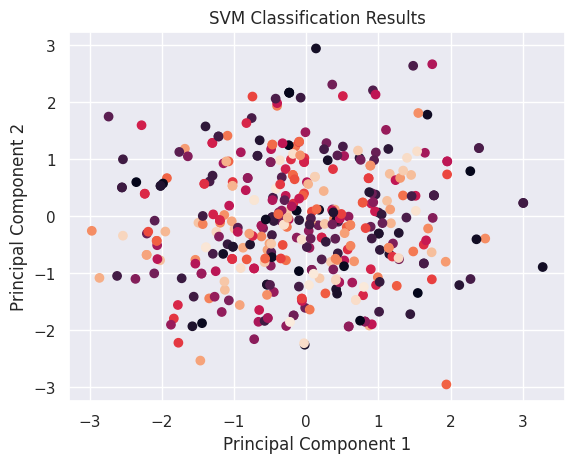

In [122]:
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=Y_test)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("SVM Classification Results")
plt.show()

**Discussing practical implications of SVM in real-world classification tasks.**

Support Vector Machines (SVMs) have been widely used in various real-world classification tasks due to their ability to handle high-dimensional data, non-linear relationships, and robustness to outliers.

Implications of SVM in real-world classification tasks:


*   Text Classification:

SVMs have been used in text classification tasks such as spam vs. non-spam emails, sentiment analysis, and topic modeling.
*   Image Classification:

SVMs have been used in image classification tasks such as object recognition, facial recognition, and image segmentation.



*   Recommendation Systems:

SVMs have been used in recommendation systems such as product recommendation, movie recommendation, and music recommendation.
*   Financial Analysis:

SVMs have been used in financial analysis tasks such as credit risk assessment, stock market prediction, and portfolio optimization.

